# New York Foursqaure Neigborhood and  Restaurant Analysis with Covid Reopenings

In [1]:
import numpy as np 

import pandas as pd 
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json 

from geopy.geocoders import Nominatim 

import requests 
from pandas import json_normalize 

import matplotlib.cm as cm
import matplotlib.colors as colors

from sklearn.cluster import KMeans

import folium 

print('Libraries imported.')

Libraries imported.


Lets load the NY json file that has all the niegborhoods.

Data source for NY neigborhoods: https://geo.nyu.edu/catalog/nyu_2451_34572

In [2]:
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)

Lets now look at the NY data in the json file.

In [3]:
neighborhoods_data = newyork_data['features']

Now we transform the data into a pandas dataframe

In [4]:
# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

In [5]:
# loop through the file to add data to the dataframe
for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [6]:
#see the results
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Bronx,Wakefield,40.894705,-73.847201
1,Bronx,Co-op City,40.874294,-73.829939
2,Bronx,Eastchester,40.887556,-73.827806
3,Bronx,Fieldston,40.895437,-73.905643
4,Bronx,Riverdale,40.890834,-73.912585


In [7]:
print('The dataframe has {} boroughs and {} neighborhoods.'.format(
        len(neighborhoods['Borough'].unique()),
        neighborhoods.shape[0]
    )
)

The dataframe has 5 boroughs and 306 neighborhoods.


In [8]:
neighborhoods['Borough'].unique()

array(['Bronx', 'Manhattan', 'Brooklyn', 'Queens', 'Staten Island'],
      dtype=object)

#### Create a map of Manhattan and show Soho location within it.

In [9]:
manhattan = neighborhoods[(neighborhoods['Borough'] == 'Manhattan') & (neighborhoods['Neighborhood'] == 'Soho')].reset_index(drop=True)
manhattan.head()

,Borough,Neighborhood,Latitude,Longitude
0,Manhattan,Soho,40.722184,-74.000657


Let's get the geographical coordinates of Manhattan.

In [10]:
address = 'Soho, NY'

geolocator = Nominatim(user_agent="ny_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Soho are {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Soho are 40.72288, -73.9987505.


In [11]:
# Show SoHo
manhattan_map = folium.Map(location=[latitude, longitude], zoom_start=16)


for lat, lng, label in zip(manhattan['Latitude'], manhattan['Longitude'], manhattan['Neighborhood']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=20,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(manhattan_map)  
    
manhattan_map

Next, start utilizing the Foursquare API to explore the neighborhoods and segment them.

In [12]:
CLIENT_ID = 'xxxxx' # your Foursquare ID
CLIENT_SECRET = 'xxxxxxx' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version

#### Explore Soho 1st

Get the neighborhood's latitude and longitude values.

In [13]:
# soho is index 23
manhattan.loc[0, 'Neighborhood']

'Soho'

In [14]:
neighborhood_latitude = manhattan.loc[0, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = manhattan.loc[0, 'Longitude'] # neighborhood longitude value

neighborhood_name = manhattan.loc[0, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of Soho are 40.72218384131794, -74.00065666959759.


#### Top 100 venues in SOHO within a radius of 500 meters.
Need to create URL 1st

In [15]:
LIMIT = 100 # limit of number of venues returned by Foursquare API


radius = 500 # define radius


 # create the API request URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
CLIENT_ID, 
CLIENT_SECRET, 
VERSION, 
lat, 
lng, 
radius, 
LIMIT)

url

'https://api.foursquare.com/v2/venues/explore?&client_id=T4EI1K4HR3XFCHA2BT3FKQSKBVM2PS2AVIG1LUAQRF3T33NT&client_secret=0NDXDE1HRRZLVFK1HK2ZROL11PTWJGSCV3JD2FUMRYITF4UE&v=20180605&ll=40.72218384131794,-74.00065666959759&radius=500&limit=100'

In [16]:
#View results

results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '5f15b96e9cc8a84856d558a4'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'},
    {'name': '$-$$$$', 'key': 'price'}]},
  'headerLocation': 'SoHo',
  'headerFullLocation': 'SoHo, New York',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 131,
  'suggestedBounds': {'ne': {'lat': 40.726683845817945,
    'lng': -73.99473014849455},
   'sw': {'lat': 40.71768383681794, 'lng': -74.00658319070062}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4bc11de1abf49521cf98c093',
       'name': 'Dance With Me SoHo',
       'location': {'address': '466 Broome St',
        'crossStreet': 'Greene Street',
        'lat': 40.72257786685151,
        'lng': -74.001363387788

Look at the category using the 4 sq API

In [17]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

Clean the json and structure it into a pd dataframe.

In [18]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

,name,categories,lat,lng
0,Dance With Me SoHo,Dance Studio,40.722578,-74.001363
1,Sam Brocato Salon,Salon / Barbershop,40.722371,-74.002562
2,MUJI 無印良品 (MUJI),Miscellaneous Shop,40.720709,-74.001015
3,Purl Soho,Arts & Crafts Store,40.722326,-74.000994
4,Saturdays Surf NYC,Clothing Store,40.720746,-73.999346


And how many venues were returned by Foursquare?

In [19]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

100 venues were returned by Foursquare.


### Explore the neighborhoods in Manhattan

In [20]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Now write the code to run the above function on each neighborhood and create a new dataframe called soho_venues.

In [21]:
soho_venues = getNearbyVenues(names=manhattan['Neighborhood'],
                                   latitudes=manhattan['Latitude'],
                                   longitudes=manhattan['Longitude']
                                  )

Soho


In [22]:
print(soho_venues.shape)
soho_venues.head()

(100, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Soho,40.722184,-74.000657,Dance With Me SoHo,40.722578,-74.001363,Dance Studio
1,Soho,40.722184,-74.000657,Sam Brocato Salon,40.722371,-74.002562,Salon / Barbershop
2,Soho,40.722184,-74.000657,MUJI 無印良品 (MUJI),40.720709,-74.001015,Miscellaneous Shop
3,Soho,40.722184,-74.000657,Purl Soho,40.722326,-74.000994,Arts & Crafts Store
4,Soho,40.722184,-74.000657,Saturdays Surf NYC,40.720746,-73.999346,Clothing Store


#### Let's find out how many unique categories can be found from all the returned venues

In [23]:
print('There are {} uniques categories.'.format(len(soho_venues['Venue Category'].unique())))

There are 60 uniques categories.


### transform soho venues into dummies so we can count freqs

In [24]:
# one hot encoding
soho_onehot = pd.get_dummies(soho_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
soho_onehot['Neighborhood'] = soho_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [soho_onehot.columns[-1]] + list(soho_onehot.columns[:-1])
soho_onehot = soho_onehot[fixed_columns]

soho_onehot.head()

,Neighborhood,American Restaurant,Art Gallery,Arts & Crafts Store,Australian Restaurant,Bakery,Bookstore,Boutique,Bubble Tea Shop,Café,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Cosmetics Shop,Cupcake Shop,Dance Studio,Design Studio,Dessert Shop,Egyptian Restaurant,Electronics Store,Falafel Restaurant,Flea Market,French Restaurant,Furniture / Home Store,Gym,Gym / Fitness Center,History Museum,Hotel,Hotel Bar,Ice Cream Shop,Italian Restaurant,Japanese Restaurant,Jewelry Store,Lingerie Store,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Miscellaneous Shop,Newsstand,Paper / Office Supplies Store,Perfume Shop,Pizza Place,Salad Place,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Shoe Store,Snack Place,Spa,Spanish Restaurant,Sporting Goods Shop,Supermarket,Sushi Restaurant,Tapas Restaurant,Thai Restaurant,Theater,Vegetarian / Vegan Restaurant,Wine Bar,Women's Store,Yoga Studio
0,Soho,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,Soho,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,Soho,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,Soho,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,Soho,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [25]:
soho_onehot.shape

(100, 61)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [26]:
soho_grouped = soho_onehot.groupby('Neighborhood').mean().reset_index()
soho_grouped

,Neighborhood,American Restaurant,Art Gallery,Arts & Crafts Store,Australian Restaurant,Bakery,Bookstore,Boutique,Bubble Tea Shop,Café,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Cosmetics Shop,Cupcake Shop,Dance Studio,Design Studio,Dessert Shop,Egyptian Restaurant,Electronics Store,Falafel Restaurant,Flea Market,French Restaurant,Furniture / Home Store,Gym,Gym / Fitness Center,History Museum,Hotel,Hotel Bar,Ice Cream Shop,Italian Restaurant,Japanese Restaurant,Jewelry Store,Lingerie Store,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Miscellaneous Shop,Newsstand,Paper / Office Supplies Store,Perfume Shop,Pizza Place,Salad Place,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Shoe Store,Snack Place,Spa,Spanish Restaurant,Sporting Goods Shop,Supermarket,Sushi Restaurant,Tapas Restaurant,Thai Restaurant,Theater,Vegetarian / Vegan Restaurant,Wine Bar,Women's Store,Yoga Studio
0,Soho,0.01,0.01,0.01,0.01,0.03,0.01,0.02,0.01,0.02,0.01,0.04,0.01,0.07,0.02,0.01,0.01,0.01,0.02,0.01,0.02,0.01,0.01,0.03,0.02,0.01,0.01,0.01,0.02,0.01,0.01,0.09,0.01,0.01,0.01,0.04,0.02,0.01,0.01,0.01,0.01,0.01,0.01,0.01,0.03,0.02,0.02,0.01,0.01,0.01,0.01,0.01,0.01,0.02,0.01,0.01,0.01,0.01,0.02,0.03,0.01


In [27]:
soho_grouped.shape

(1, 61)

#### Let's print the SoHo top 10 frequently occuring venues.

In [28]:
num_top_venues = 10

for hood in soho_grouped['Neighborhood']:
    temp = soho_grouped[soho_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
#     print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
#     print('\n')
    soho1 = (temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
        

In [29]:
soho1

,venue,freq
0,Italian Restaurant,0.09
1,Coffee Shop,0.07
2,Mediterranean Restaurant,0.04
3,Clothing Store,0.04
4,Women's Store,0.03
5,Bakery,0.03
6,Salon / Barbershop,0.03
7,French Restaurant,0.03
8,Dessert Shop,0.02
9,Hotel,0.02


In [30]:
soho1.set_index('venue', inplace=True)

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

Text(0.5, 1.0, 'Top 10 Most Frequently Occuring Venues in SoHo, NYC')

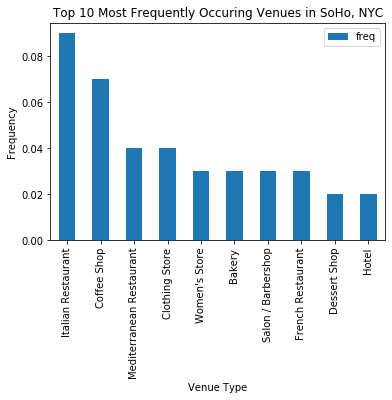

In [32]:
soho1.plot(kind='bar')
plt.xlabel('Venue Type')
plt.ylabel('Frequency')
plt.title('Top 10 Most Frequently Occuring Venues in SoHo, NYC')

#### Put  into a pd dataframe

First, let's write a function to sort the venues in descending order.

In [33]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for SoHo.

In [34]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = soho_grouped['Neighborhood']

for ind in np.arange(soho_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(soho_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Soho,Italian Restaurant,Coffee Shop,Clothing Store,Mediterranean Restaurant,French Restaurant,Bakery,Women's Store,Salon / Barbershop,Furniture / Home Store,Cosmetics Shop


# import NYC open restaurant info from aplications csv

Data Source: https://data.cityofnewyork.us/Transportation/Open-Restaurant-Applications/pitm-atqc

In [35]:
df_open = pd.read_csv('Open_Restaurant_Applications.csv')

In [36]:
df_open.head()

,Seating Interest (Sidewalk/Roadway/Both),Restaurant Name,Bulding Number,Borough,Postcode,Business Address,Latitude,Longitude
0,sidewalk,Arbuz Cafe,1706,Brooklyn,11235,"1706 Sheepshead Bay Rd, Brooklyn, NY",40.585724,-73.951767
1,roadway,Nerai,55,Manhattan,10022,"55 East 54th Street, Manhattan, NY",40.760117,-73.973162
2,roadway,Hill Country,30,Manhattan,10010,"30 West 26th, Manhattan, NY",NaN,NaN
3,both,Sundays Well,360,Manhattan,10016,"360 3rd Ave, Manhattan, NY",40.740892,-73.981657
4,roadway,"Le Baba Cool, Inc",64,Brooklyn,11217,"64 Lafayette AVe, Brooklyn, NY",40.687102,-73.975365


In [37]:
print('The dataframe has {} boroughs and {} Restaurant Names.'.format(
        len(df_open['Borough'].unique()),
        df_open.shape[0]
    )
)

The dataframe has 5 boroughs and 7939 Restaurant Names.


In [38]:
df_open['Borough'].value_counts()

Manhattan        3776
Brooklyn         1963
Queens           1632
Bronx             422
Staten Island     146
Name: Borough, dtype: int64

lets adress the NaN values fro longitude and latitude since we cant use these.

In [39]:
df_open.isnull().sum()

Seating Interest (Sidewalk/Roadway/Both)      0
Restaurant Name                               0
Bulding Number                                0
Borough                                       0
Postcode                                      0
Business Address                              0
Latitude                                    996
Longitude                                   996
dtype: int64

The general rul is no more than 5% of total data but given we are using what we have to identify open outsode rest, we will drop the missing long/lat rows which ttoal 996 in 5 different burroughs which is approximately 8%.

In [40]:
df_open_new = df_open.dropna(subset=['Longitude'], axis=0)

In [41]:
df_open_new.isnull().sum()

Seating Interest (Sidewalk/Roadway/Both)    0
Restaurant Name                             0
Bulding Number                              0
Borough                                     0
Postcode                                    0
Business Address                            0
Latitude                                    0
Longitude                                   0
dtype: int64

# fix bar char here and be done!

In [42]:
df_sh_bar = df_open_new['Borough'].value_counts('Restaurant Name' )


In [43]:
df_sh_bar = pd.DataFrame(df_open_new['Borough'].value_counts())


In [44]:

df_sh_bar.head()

,Borough
Manhattan,3237
Brooklyn,1753
Queens,1459
Bronx,364
Staten Island,130


Text(0, 0.5, 'Open Restaurant Count')

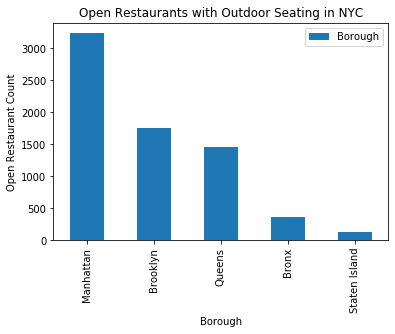

In [45]:
df_sh_bar.head().plot(kind='bar')
plt.title('Open Restaurants with Outdoor Seating in NYC')
plt.xlabel('Borough')
plt.ylabel('Open Restaurant Count')

In [46]:
# create map of New York openrestaurants using latitude and longitude values
map_newyork_open = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, Restaurant in zip(df_open_new['Latitude'], df_open_new['Longitude'], df_open_new['Borough'], df_open_new['Restaurant Name']):
    label = '{}, {}'.format(Restaurant,  borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=3,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_newyork_open)  
    
map_newyork_open

Now lets break it down to Manhattan as before.

take df_open_new and subset to manhattan and do one for brooklyn and the bronx then create a map, change from blue markers as well

In [47]:
df_man = df_open_new[df_open_new['Borough'] == 'Manhattan']
df_man.head()

,Seating Interest (Sidewalk/Roadway/Both),Restaurant Name,Bulding Number,Borough,Postcode,Business Address,Latitude,Longitude
1,roadway,Nerai,55,Manhattan,10022,"55 East 54th Street, Manhattan, NY",40.760117,-73.973162
3,both,Sundays Well,360,Manhattan,10016,"360 3rd Ave, Manhattan, NY",40.740892,-73.981657
11,roadway,Khe-Yo,157,Manhattan,10013,"157 Duane St., Manhattan, NY",40.716761,-74.008744
16,both,Aunt Jake's,133,Manhattan,10013,"133 Mulberry Street, Manhattan, NY",40.718455,-73.997760
21,sidewalk,North Square Restaurant,103,Manhattan,10011,"103 Waverly Place, Manhattan, NY",40.732360,-73.998889


In [48]:
df_man['Borough'].value_counts()

Manhattan    3237
Name: Borough, dtype: int64

### Create zip dataframe and bar, and be done

In [49]:
df_post = pd.DataFrame(df_man['Postcode'].value_counts())

In [51]:
df_post.head()

,Postcode
10003,280
10014,208
10013,193
10012,176
10009,168


In [54]:
df_post.columns

Index(['Postcode'], dtype='object')

Text(0, 0.5, 'Restaurant Count')

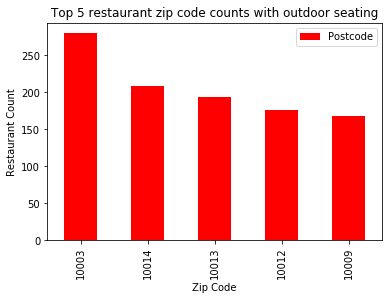

In [62]:
df_post.head().plot(kind='bar', color='red')
plt.title('Top 5 restaurant zip code counts with outdoor seating')
plt.xlabel('Zip Code')
plt.ylabel('Restaurant Count')


### Top zip Rest in SoHo

In [63]:
#lets look at the top zip code 1012
df_man1 = df_open_new[(df_open_new['Borough'] == 'Manhattan') & (df_open_new['Postcode'] == 10012)]
df_man1.head()

,Seating Interest (Sidewalk/Roadway/Both),Restaurant Name,Bulding Number,Borough,Postcode,Business Address,Latitude,Longitude
25,both,Lovely Day,196,Manhattan,10012,"196 Elizabeth Street, Manhattan, NY",40.721848,-73.994484
39,sidewalk,The woo,206,Manhattan,10012,"206 Spring st, Manhattan, NY",40.725320,-74.003543
53,sidewalk,Museum of Ice Cream,558,Manhattan,10012,"558 BROADWAY, Manhattan, NY",40.723860,-73.998092
119,sidewalk,Cipriani Downtown,376,Manhattan,10012,"376 W Broadway, Manhattan, NY",40.723769,-74.002605
145,both,Court Street Grocers,540,Manhattan,10012,"540 LaGuardia Place, Manhattan, NY",40.728655,-73.998463


In [64]:
df_man1['Seating Interest (Sidewalk/Roadway/Both)'].value_counts() 

both        106
roadway      35
sidewalk     35
Name: Seating Interest (Sidewalk/Roadway/Both), dtype: int64

In [67]:
# create map of New York using latitude and longitude values
map_man_open1 = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, Restaurant in zip(df_man1['Latitude'], df_man1['Longitude'], df_man1['Borough'], df_man1['Restaurant Name']):
    label = '{}, {}'.format(Restaurant,  borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#f76a8c',
        fill_opacity=0.7,
        parse_html=False).add_to(map_man_open1)  
    
map_man_open1

Join the manhattan data table with our df_man table and see the results of combinig the 4sq data with the reopened data

In [68]:
#Union Square  zip code 10010
df_man2 = df_open_new[(df_open_new['Borough'] == 'Manhattan') & (df_open_new['Postcode'] == 10013)]
df_man2.head()

,Seating Interest (Sidewalk/Roadway/Both),Restaurant Name,Bulding Number,Borough,Postcode,Business Address,Latitude,Longitude
11,roadway,Khe-Yo,157,Manhattan,10013,"157 Duane St., Manhattan, NY",40.716761,-74.008744
16,both,Aunt Jake's,133,Manhattan,10013,"133 Mulberry Street, Manhattan, NY",40.718455,-73.997760
47,both,Nom Wah Tea Parlor,13,Manhattan,10013,"13 Doyers Street, Manhattan, NY",40.714558,-73.998128
74,both,Il Piccolo Bufalo Restaurant,141,Manhattan,10013,"141 Mulberry Street, Manhattan, NY",40.718705,-73.997619
76,both,jaya 888,90,Manhattan,10013,"90 baxter street, Manhattan, NY",40.716850,-73.999755


In [69]:
df_man2['Seating Interest (Sidewalk/Roadway/Both)'].value_counts() 

both        124
sidewalk     46
roadway      23
Name: Seating Interest (Sidewalk/Roadway/Both), dtype: int64

In [70]:
# create map of New York using latitude and longitude values
map_man_open2 = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
for lat, lng, borough, Restaurant in zip(df_man2['Latitude'], df_man2['Longitude'], df_man2['Borough'], df_man2['Restaurant Name']):
    label = '{}, {}'.format(Restaurant,  borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='red',
        fill=True,
        fill_color='#f76a8c',
        fill_opacity=0.7,
        parse_html=False).add_to(map_man_open2)  
    
map_man_open2

#### inner join the two data sets to get only those with outdoor seating in soho

In [84]:
soho_merged = pd.merge(df_man1, nearby_venues, how='left', on=None, left_on='Restaurant Name', right_on='name',)

In [85]:
soho_merged.head()

,Seating Interest (Sidewalk/Roadway/Both),Restaurant Name,Bulding Number,Borough,Postcode,Business Address,Latitude,Longitude,name,categories,lat,lng
0,both,Lovely Day,196,Manhattan,10012,"196 Elizabeth Street, Manhattan, NY",40.721848,-73.994484,NaN,NaN,NaN,NaN
1,sidewalk,The woo,206,Manhattan,10012,"206 Spring st, Manhattan, NY",40.725320,-74.003543,NaN,NaN,NaN,NaN
2,sidewalk,Museum of Ice Cream,558,Manhattan,10012,"558 BROADWAY, Manhattan, NY",40.723860,-73.998092,NaN,NaN,NaN,NaN
3,sidewalk,Cipriani Downtown,376,Manhattan,10012,"376 W Broadway, Manhattan, NY",40.723769,-74.002605,Cipriani Downtown,Italian Restaurant,40.723565,-74.002773
4,both,Court Street Grocers,540,Manhattan,10012,"540 LaGuardia Place, Manhattan, NY",40.728655,-73.998463,NaN,NaN,NaN,NaN


In [86]:
soho_merged['Restaurant Name'].count()

176

In [87]:
# create map of New York using latitude and longitude values
map_soho_open1 = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, Restaurant in zip(soho_merged['Latitude'], soho_merged['Longitude'], soho_merged['Borough'], soho_merged['Restaurant Name']):
    label = '{}, {}'.format(Restaurant,  borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_soho_open1)  
    
map_soho_open1

In [81]:
soho_merged2 = pd.merge(df_man2, nearby_venues, how='left', on=None, left_on='Restaurant Name', right_on='name')

In [82]:
soho_merged2['Restaurant Name'].count()

193

In [83]:
# create map of New York using latitude and longitude values
map_soho_open2 = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, borough, Restaurant in zip(soho_merged2['Latitude'], soho_merged2['Longitude'], soho_merged2['Borough'], soho_merged2['Restaurant Name']):
    label = '{}, {}'.format(Restaurant,  borough)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_soho_open2)  
    
map_soho_open2